In [15]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Diccionario de zonas horarias
timezone_dict = {
    'ar': 'Asia/Riyadh',
    'de': 'Europe/Berlin',
    'hu': 'Europe/Budapest',
    'zh': 'Asia/Shanghai',
    'es': 'Europe/Madrid',
    'fr': 'Europe/Paris',
    'vi': 'Asia/Ho_Chi_Minh',
    'ru': 'Europe/Moscow',
    'ja': 'Asia/Tokyo',
    'it': 'Europe/Rome',
    'pt': 'Europe/Lisbon'  # Cambio realizado aquí
}

# Diccionario de traducción
translation_dict = {
    'arte': 'art',
    'deporte': 'sports',
    'derecho': 'rights',
    'eventos': 'events',
    'filosofia': 'philosophy',
    'geografia': 'geography',
    'historia': 'history',
    'juegos': 'games',
    'matematica': 'mathematics',
    'naturaleza': 'nature',
    'politica': 'politics',
    'salud': 'health',
    'desportos': 'sports',
    'direito': 'rights',
    'jogos': 'games',
    'natureza': 'nature',
    'religiao': 'religion',
    'saude': 'health'
}

directory = 'converted'  # Asegúrate de que el directorio es correcto
language_editors = {}  # Diccionario para guardar los editores de cada idioma

# Loop a través de cada archivo en el directorio
for file in os.listdir(directory):
    if file.startswith('df_'):
        language = file.split('_')[1].split('.')[0]  # Extrae el idioma del nombre del archivo
        print('Reading File:', file)
        
        # Cargar el dataframe
        path = os.path.join(directory, file)
        df = pd.read_pickle(path)

         # Convertir 'datetime' a objetos datetime
        if language == 'pt':
            df['datetime'] = pd.to_datetime(df['timestamp'], format='%Y-%m-%dT%H:%M:%SZ', utc=True)
        else:
            df['datetime'] = pd.to_datetime(df['timestamp'], unit='s', utc=True)
        
        # Convertir la hora a la zona horaria del idioma
        df['datetime'] = df['datetime'].dt.tz_convert(timezone_dict[language])

        # Convertir 'datetime' a objetos datetime
        df['datetime'] = pd.to_datetime(df['datetime'])
        df['day_of_week'] = df['datetime'].dt.dayofweek
        df['hour'] = df['datetime'].dt.hour

        # Explode en la columna 'categories' para separar las categorías
        df = df.explode('categories')

        # Traducir las categorías usando el diccionario de traducción
        df['categories'] = df['categories'].map(translation_dict).fillna(df['categories'])

                # Filtrar las categorías para eliminar 'food'
        df = df[df['categories'] != 'foods']

       # Agrupar por categoría, día de la semana y hora, y contar los editores únicos
        category_editors = df.groupby(['categories', 'day_of_week', 'hour'])['user'].nunique().unstack(level=0, fill_value=0)


        # Almacenar la actividad por categoría en el diccionario
        if language not in language_editors:
            language_editors[language] = {}
        for category in category_editors.columns:
            if category != 'foods':  # Filtrar aquí también para asegurarse
                if category not in language_editors[language]:
                    language_editors[language][category] = category_editors[category]

Reading File: df_ar
Reading File: df_de
Reading File: df_hu
Reading File: df_zh
Reading File: df_pt
Reading File: df_es
Reading File: df_fr
Reading File: df_vi
Reading File: df_ru
Reading File: df_ja
Reading File: df_it


In [17]:
import pickle
# Guardar el diccionario en un archivo pickle
with open('language_editors.pkl', 'wb') as f:
    pickle.dump(language_editors, f)

print('language_editors guardado en language_editors.pkl')

language_editors guardado en language_editors.pkl


In [3]:
import pickle

    
with open('language_editors.pkl', 'rb') as x:
    language_editors= pickle.load(x)

print("El diccionario language_editors ha sido cargado correctamente.")


El diccionario language_editors ha sido cargado correctamente.


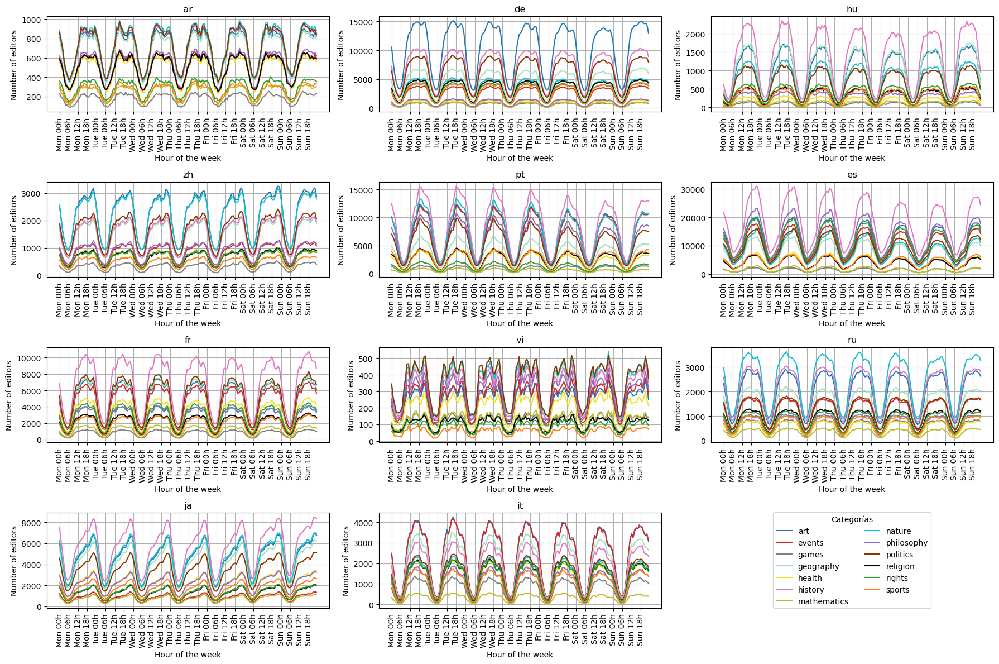

In [16]:
# Diccionario de zonas horarias
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# Diccionario de colores para cada categoría
color_dict = {
    'art': '#1f77b4',        # Azul
    'sports': '#ff7f0e',     # Naranja
    'rights': '#2ca02c',     # Verde
    'events': '#d62728',     # Rojo
    'philosophy': '#9467bd', # Púrpura
    'geography': '#9FE2BF',  # Marrón
    'history': '#e377c2',    # Rosa
    'games': '#7f7f7f',      # Gris
    'mathematics': '#bcbd22',# Oliva
    'nature': '#17becf',     # Cian
    'politics': '#873600',   # Cafe obscuro
    'health': '#F5E11B',     # Amarillo
    'religion': '#000000',   # Negro
}
# Crear una figura con subplots de 4x3
fig, axes = plt.subplots(4, 3, figsize=(18, 12))

# Iterar sobre los idiomas y crear los gráficos
for i, (language, categories) in enumerate(language_editors.items()):
    ax = axes.flat[i]
    for category, activity in categories.items():
        hours_extended = np.tile(np.arange(24), 7) + np.repeat(np.arange(7) * 24, 24)
        edits = activity.values.flatten()
        ax.plot(hours_extended, edits, linestyle='-', color=color_dict.get(category, 'black'), label=category)
    ax.set_title(f'{language}')
    ax.set_xlabel('Hour of the week')
    ax.set_ylabel('Number of editors')
    ax.grid(True)
    ax.set_xticks(np.arange(0, 7*24, 6))
    ax.set_xticklabels([f'{d} {h:02d}h' for d in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'] for h in range(0, 24, 6)], rotation=90)

# Ocultar el último subplot (11 idiomas = 12 subplots, uno estará vacío)
axes.flat[-1].axis('off')

# Agregar la leyenda en el subplot vacío
handles, labels = ax.get_legend_handles_labels()
axes.flat[-1].legend(handles, labels, loc='center', title='Categorías', ncol=2)

# Ajustar el diseño
plt.tight_layout()
plt.show()

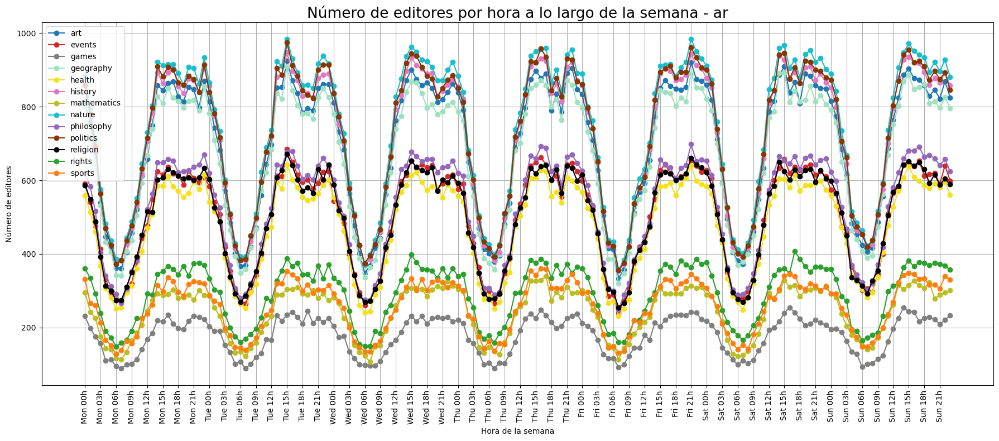

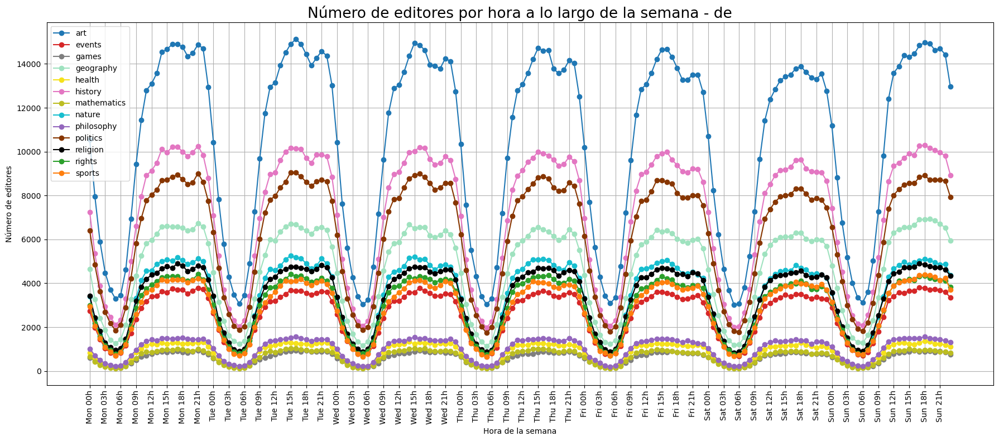

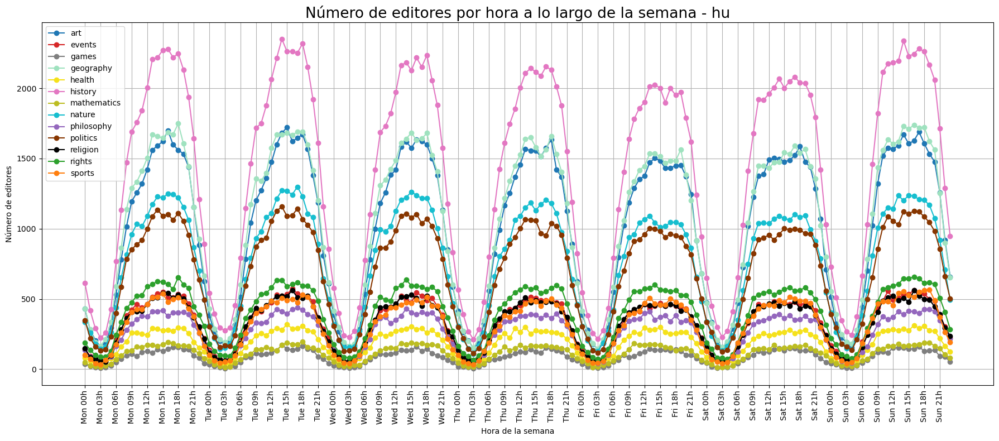

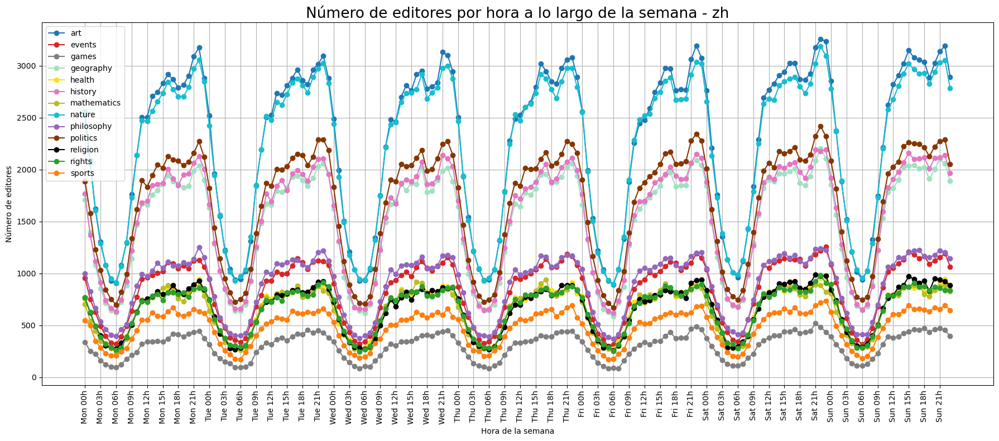

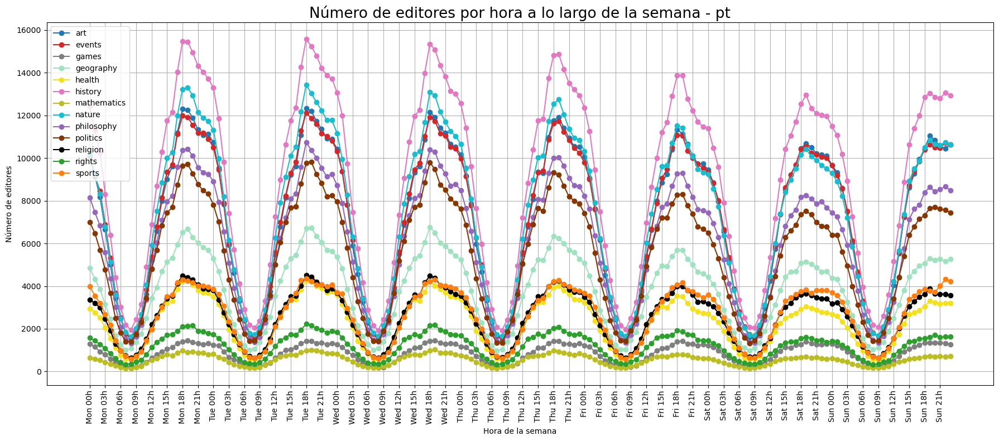

...

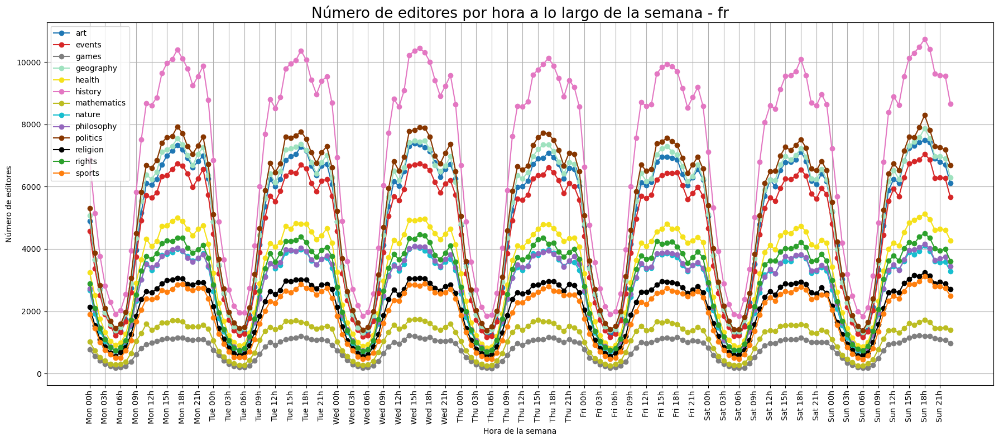

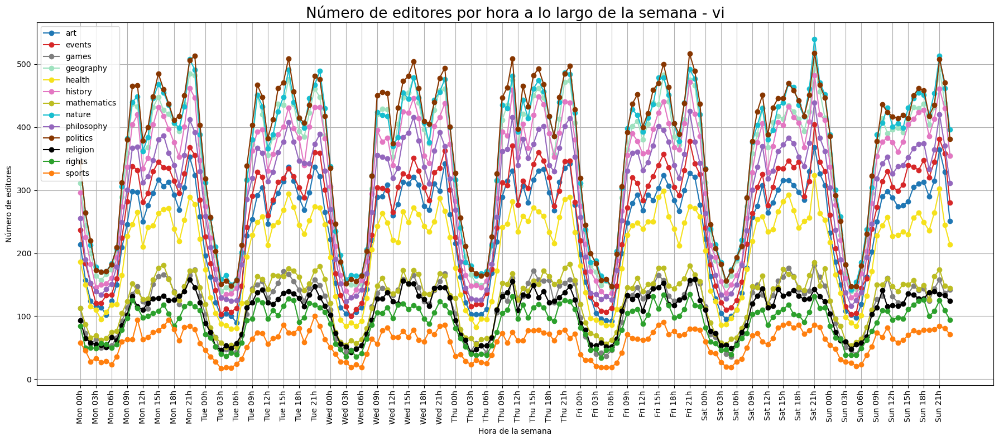

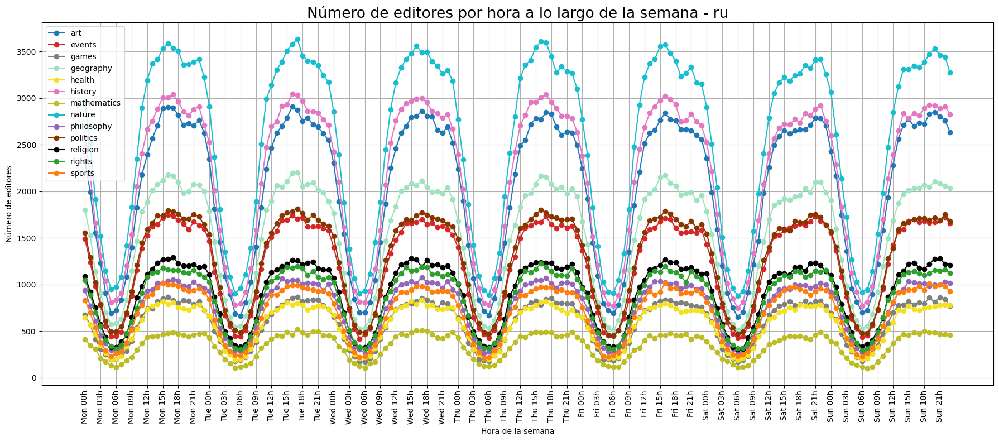

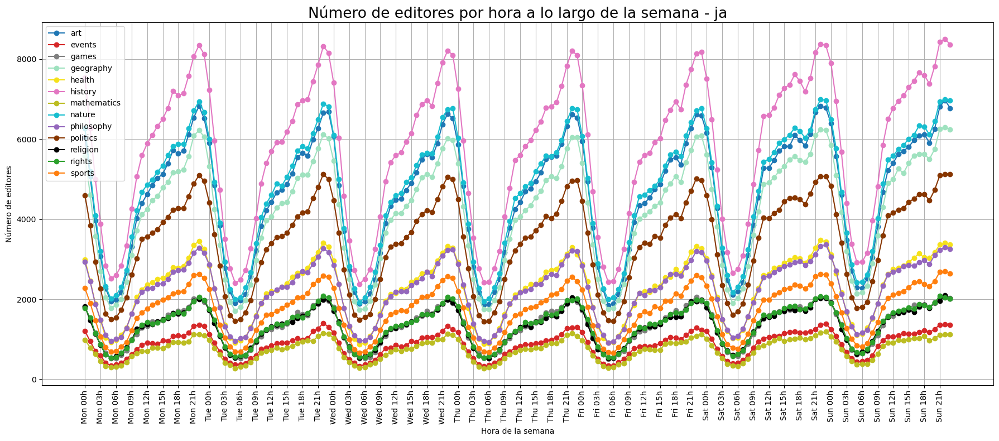

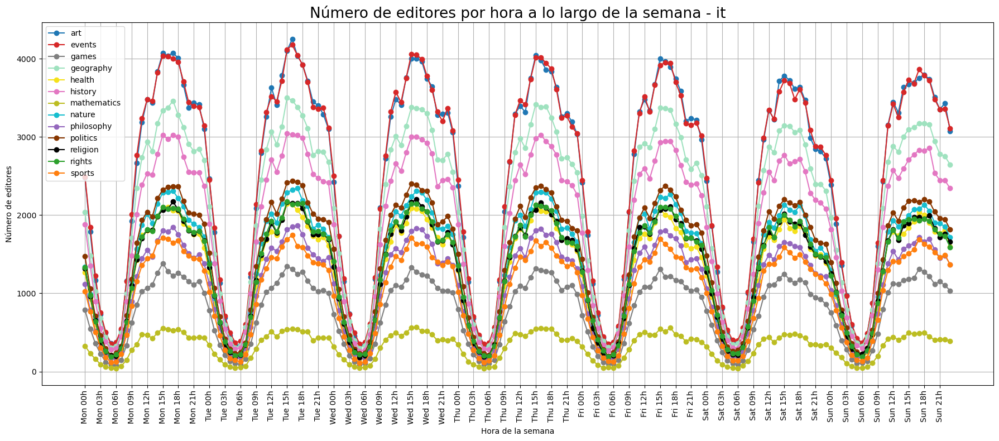

In [19]:


# Crear gráficos por cada idioma
for language, categories in language_editors.items():
    plt.figure(figsize=(18, 8))
    for category, activity in categories.items():
        hours_extended = np.tile(np.arange(24), 7) + np.repeat(np.arange(7) * 24, 24)
        edits = activity.values.flatten()
        plt.plot(hours_extended, edits, marker='o', linestyle='-', color=color_dict.get(category, 'black'), label=category)

    plt.title(f'Número de editores por hora a lo largo de la semana - {language}',fontsize=19)
    plt.xlabel('Hora de la semana')
    plt.ylabel('Número de editores')
    plt.legend()
    plt.grid(True)
    plt.xticks(np.arange(0, 7*24, 3), [f'{d} {h:02d}h' for d in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'] for h in range(0, 24, 3)], rotation=90)
    plt.tight_layout()
    plt.show()


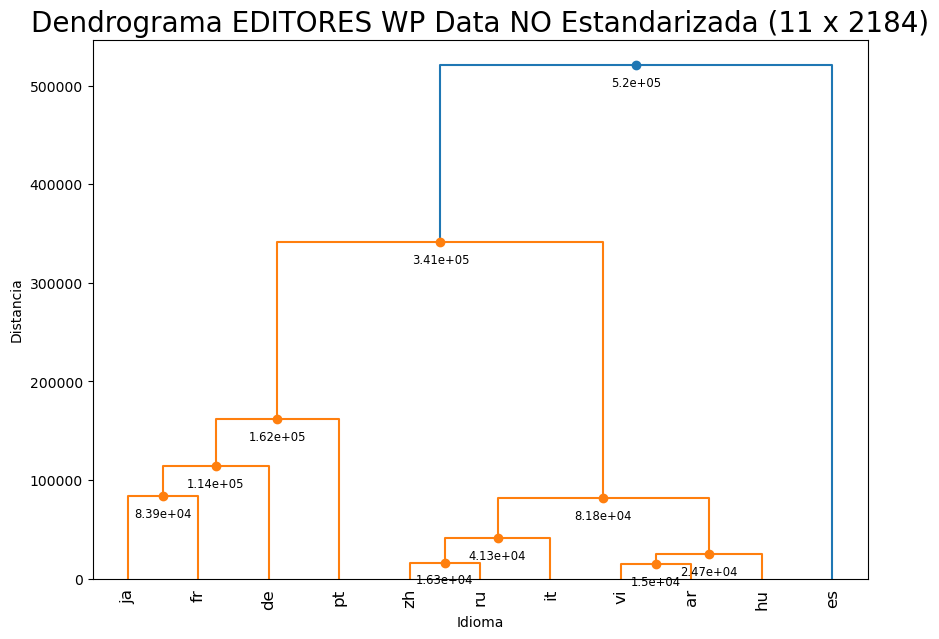

In [22]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Diccionario de números para cada categoría
category_dict = {
    'art': 1,
    'events': 2,
    'games': 3,
    'geography': 4,
    'health': 5,
    'history': 6,
    'mathematics': 7,
    'nature': 8,
    'philosophy': 9,
    'politics': 10,
    'religion': 11,
    'rights': 12,
    'sports': 13
}

data_list = []
for language, categories_data in language_editors.items():
    for category, activity in categories_data.items():
        category_number = category_dict[category]
        for (day_of_week, hour), edits in activity.items():
            # Crear una columna que represente la hora de la semana
            week_hour = day_of_week * 24 + hour
            data_list.append([language, category_number, week_hour, edits])

data = pd.DataFrame(data_list, columns=['language', 'category', 'week_hour', 'editors'])

# Pivotar el DataFrame para que cada hora de la semana sea una columna y cada fila sea una combinación de idioma y categoría
data_pivot = data.pivot_table(index=['language'], columns=['week_hour', 'category'], values='editors', fill_value=0)
# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = data_pivot

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma EDITORES WP Data NO Estandarizada (11 x 2184)',fontsize=20)
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
plt.savefig('editores/dendrogram1.png')
plt.show()


In [1]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pickle

    
with open('language_editors.pkl', 'rb') as x:
    language_editors = pickle.load(x)

print("El diccionario language_editors ha sido cargado correctamente.")

El diccionario language_editors ha sido cargado correctamente.


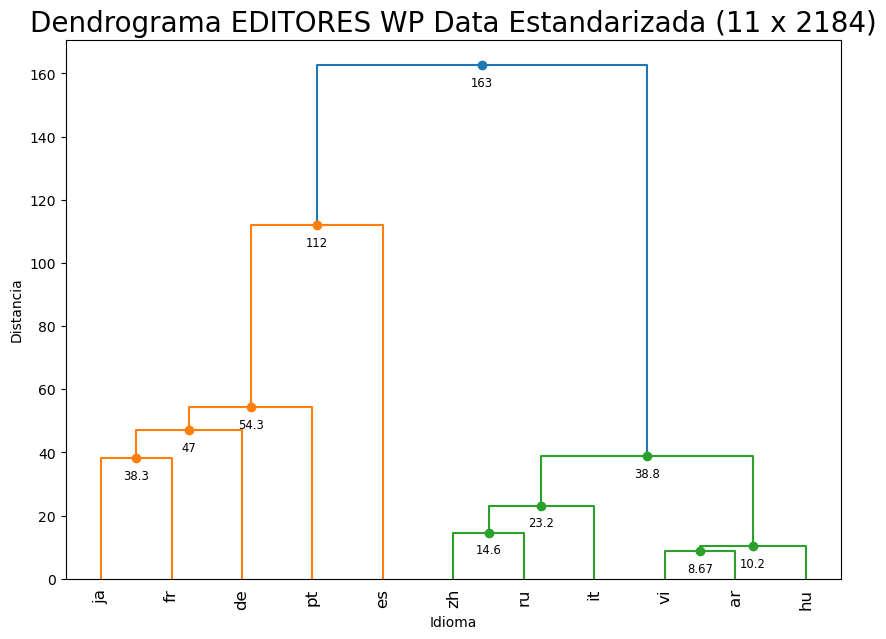

{'ar': 1, 'de': 3, 'es': 5, 'fr': 2, 'hu': 1, 'it': 1, 'ja': 2, 'pt': 4, 'ru': 1, 'vi': 1, 'zh': 1}


In [4]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Supongamos que 'data_pivot' es tu DataFrame con los datos
# data_pivot = pd.read_csv('ruta_a_tus_datos.csv')  # Ejemplo de cómo cargar tus datos

# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_pivot)

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma EDITORES WP Data Estandarizada (11 x 2184)',fontsize=20)
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
plt.show()

# Cortar el dendrograma a una altura dada o según el número de clusters deseado
# Por ejemplo, puedes especificar un número de clusters, digamos 5 clusters:
num_clusters = 5
clusters = fcluster(linked, num_clusters, criterion='maxclust')

# Asignar los clusters a los idiomas
cluster_dict = {label: cluster for label, cluster in zip(labels, clusters)}

# Mostrar los resultados
print(cluster_dict)



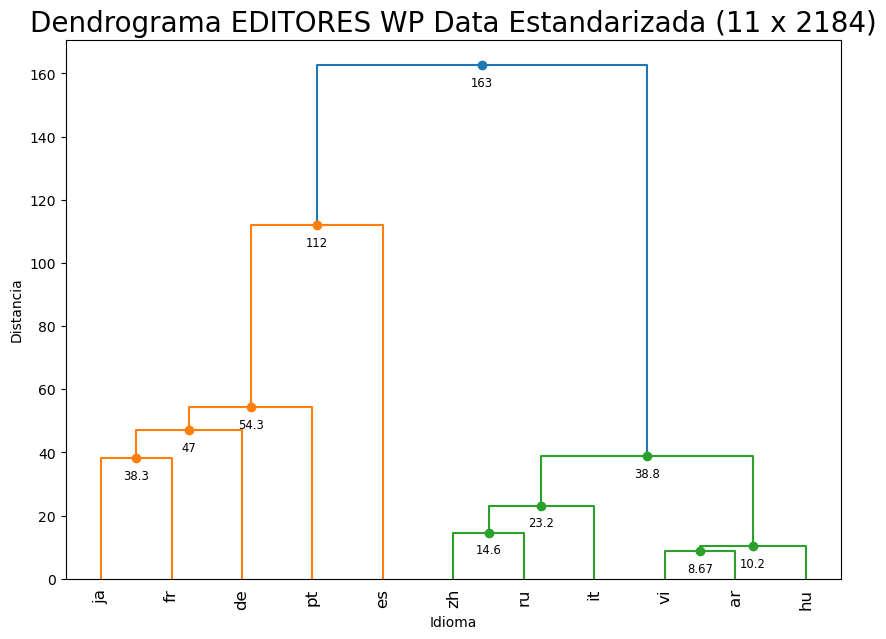

In [3]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Diccionario de números para cada categoría
category_dict = {
    'art': 1,
    'events': 2,
    'foods': 3,
    'games': 4,
    'geography': 5,
    'health': 6,
    'history': 7,
    'mathematics': 8,
    'nature': 9,
    'philosophy': 10,
    'politics': 11,
    'religion': 12,
    'rights': 13,
    'sports': 14
}


data_list = []
for language, categories_data in language_editors.items():
    for category, activity in categories_data.items():
        category_number = category_dict[category]
        for (day_of_week, hour), edits in activity.items():
            # Crear una columna que represente la hora de la semana
            week_hour = day_of_week * 24 + hour
            data_list.append([language, category_number, week_hour, edits])

data = pd.DataFrame(data_list, columns=['language', 'category', 'week_hour', 'editors'])

# Pivotar el DataFrame para que cada hora de la semana sea una columna y cada fila sea una combinación de idioma y categoría
data_pivot = data.pivot_table(index=['language'], columns=['week_hour', 'category'], values='editors', fill_value=0)

# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_pivot)

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma EDITORES WP Data Estandarizada (11 x 2184)',fontsize=20)
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
plt.savefig('editores/dendrogram2.png')
plt.show()


In [23]:
data_list = []
for language, categories_data in language_editors.items():
    for category, activity in categories_data.items():
        category_number = category_dict[category]
        for (day_of_week, hour), edits in activity.items():
            hour_of_day = hour  # Mantener solo la hora del día
            data_list.append([language, category_number, hour_of_day, edits])

data = pd.DataFrame(data_list, columns=['language', 'category', 'hour_of_day', 'edits'])

# Pivotar el DataFrame para que cada hora del día sea una columna y cada fila sea una combinación de idioma y categoría
data_pivot = data.pivot_table(index=['language'], columns=['hour_of_day', 'category'], values='edits', fill_value=0)

# Opcional: normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_pivot)
data_scaled = pd.DataFrame(data_scaled, index=data_pivot.index, columns=data_pivot.columns)

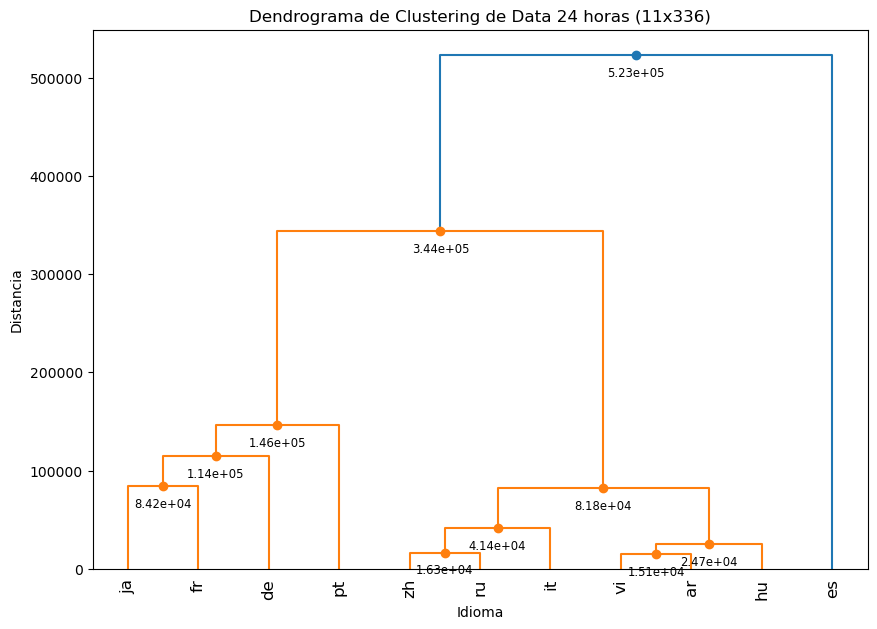

In [3]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Diccionario de números para cada categoría
category_dict = {
    'art': 1,
    'events': 2,
    'foods': 3,
    'games': 4,
    'geography': 5,
    'health': 6,
    'history': 7,
    'mathematics': 8,
    'nature': 9,
    'philosophy': 10,
    'politics': 11,
    'religion': 12,
    'rights': 13,
    'sports': 14
}


data_list = []
for language, categories_data in language_editors.items():
    for category, activity in categories_data.items():
        category_number = category_dict[category]
        for (day_of_week, hour), edits in activity.items():
            # Crear una columna que represente la hora de la semana
            week_hour = day_of_week * 24 + hour
            data_list.append([language, category_number, week_hour, edits])

data = pd.DataFrame(data_list, columns=['language', 'category', 'week_hour', 'edits'])

# Pivotar el DataFrame para que cada hora de la semana sea una columna y cada fila sea una combinación de idioma y categoría
data_pivot = data.pivot_table(index=['language'], columns=['week_hour', 'category'], values='edits', fill_value=0)

# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = data_pivot

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma de Clustering de Data 24 horas (11x336)')
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
plt.savefig('editores/dendrogram3.png')
plt.show()


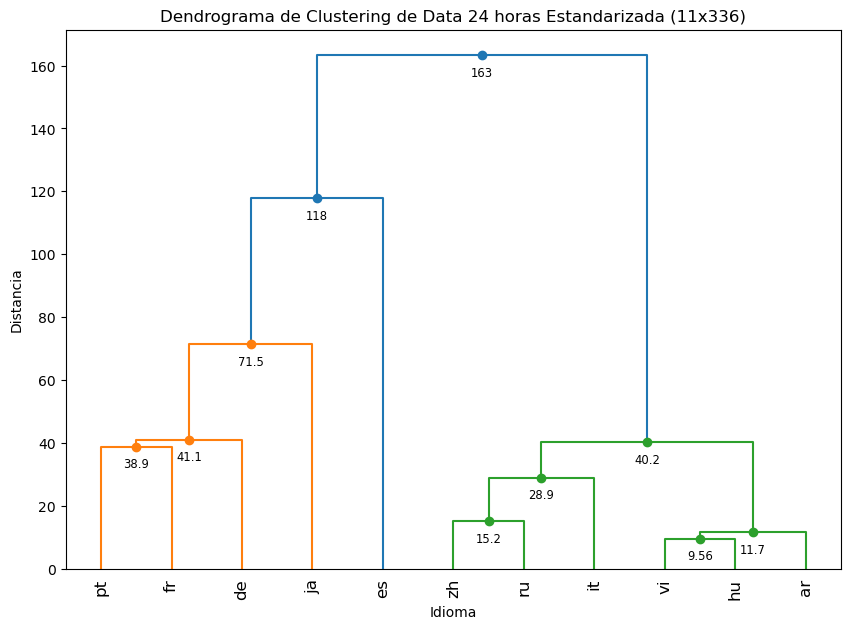

In [34]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Diccionario de números para cada categoría
category_dict = {
    'art': 1,
    'events': 2,
    'foods': 3,
    'games': 4,
    'geography': 5,
    'health': 6,
    'history': 7,
    'mathematics': 8,
    'nature': 9,
    'philosophy': 10,
    'politics': 11,
    'religion': 12,
    'rights': 13,
    'sports': 14
}


data_list = []
for language, categories_data in language_editors.items():
    for category, activity in categories_data.items():
        category_number = category_dict[category]
        for (day_of_week, hour), edits in activity.items():
            # Crear una columna que represente la hora de la semana
            week_hour = day_of_week * 24 + hour
            data_list.append([language, category_number, week_hour, edits])

data = pd.DataFrame(data_list, columns=['language', 'category', 'week_hour', 'edits'])

# Pivotar el DataFrame para que cada hora de la semana sea una columna y cada fila sea una combinación de idioma y categoría
data_pivot = data.pivot_table(index=['language'], columns=['week_hour', 'category'], values='edits', fill_value=0)

# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_pivot)

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma de Clustering de Data 24 horas Estandarizada (11x336)')
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
plt.savefig('editores/dendrogram4.png')
plt.show()


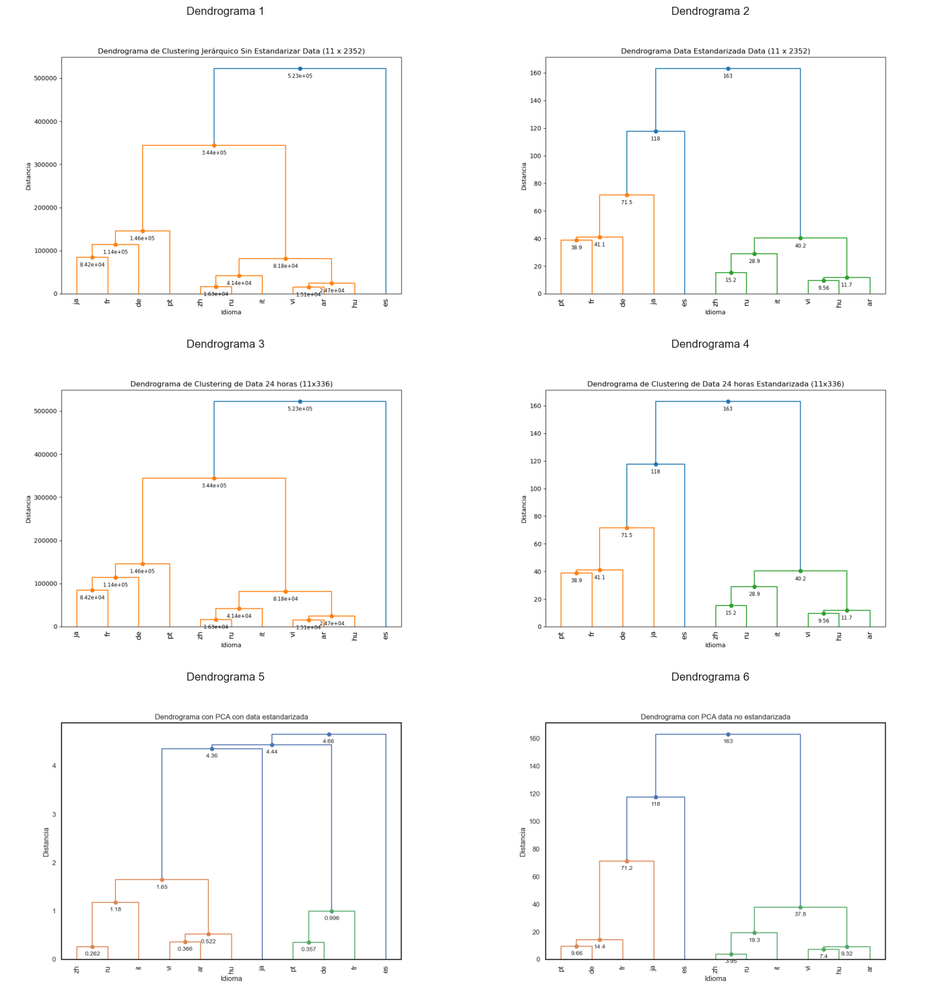

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Cargar las imágenes de los dendrogramas
img1 = mpimg.imread('editores/dendrogram1.png')
img2 = mpimg.imread('editores/dendrogram2.png')
img3 = mpimg.imread('editores/dendrogram3.png')
img4 = mpimg.imread('editores/dendrogram4.png')
img5 = mpimg.imread('editores/dendrogram5.png')
img6 = mpimg.imread('editores/dendrogram6.png')

# Crear un solo plot con 6 cuadrantes (3x2)
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

# Mostrar las imágenes en cada subplot
axs[0, 0].imshow(img1)
axs[0, 0].axis('off')
axs[0, 0].set_title('Dendrograma 1')

axs[0, 1].imshow(img2)
axs[0, 1].axis('off')
axs[0, 1].set_title('Dendrograma 2')

axs[1, 0].imshow(img3)
axs[1, 0].axis('off')
axs[1, 0].set_title('Dendrograma 3')

axs[1, 1].imshow(img4)
axs[1, 1].axis('off')
axs[1, 1].set_title('Dendrograma 4')

axs[2, 0].imshow(img5)
axs[2, 0].axis('off')
axs[2, 0].set_title('Dendrograma 5')

axs[2, 1].imshow(img6)
axs[2, 1].axis('off')
axs[2, 1].set_title('Dendrograma 6')

plt.tight_layout()
plt.show()

In [46]:
combined_activities

{'art': day_of_week  hour
 0            0       50890
              1       41397
              2       33344
              3       26365
              4       20887
                      ...  
 6            19      69046
              20      68169
              21      67696
              22      66155
              23      60102
 Name: art, Length: 168, dtype: int64,
 'events': day_of_week  hour
 0            0       33461
              1       27012
              2       22033
              3       17574
              4       13883
                      ...  
 6            19      46364
              20      45341
              21      44600
              22      43670
              23      39467
 Name: events, Length: 168, dtype: int64,
 'foods': day_of_week  hour
 0            0       1228
              1       1028
              2        799
              3        578
              4        447
                      ... 
 6            19      1345
              20      1363
    

In [24]:
data_pivot

week_hour      0                                                             \
category       1      2     4     5     6      7     8      9     10     11   
language                                                                      
ar           810    591   231   800   559    859   296    884    619    858   
de         10550   2753   614  4637   823   7238   650   3397   1021   6408   
es         14509  12582  1486  8839  4909  21719  1768  10052  15874  10688   
fr          4900   4565   769  5074  3243   6868  1016   2666   2720   5314   
hu           429    145    38   431    79    613    48    334    136    347   
it          2482   2488   789  2040  1266   1879   328   1340   1116   1473   
ja          6044   1201  1808  5588  2989   7540   986   6263   2934   4593   
pt         10111  10106  1288  4863  2947  12435   633  10186   8157   7002   
ru          2324   1491   673  1803   647   2585   413   2964    940   1557   
vi           214    237   113   311   186    296   113    344    255    344   
zh          2528    959   339  1707   754   1769   705   2559    999   1888   

week_hour  ...    167                                                \
category   ...      7     8      9     10     11    12     13    14   
language   ...                                                        
ar         ...    858   301    880    624    846   589    357   330   
de         ...   8932   828   4367   1307   7935  4351   3846  3710   
es         ...  24427  1980  11194  17828  12215  5147  15442  6072   
fr         ...   8662  1401   3277   3445   6679  2712   3613  2499   
hu         ...    947    82    493    216    501   236    285   192   
it         ...   2341   392   1717   1369   1817  1659   1589  1367   
ja         ...   8368  1125   6968   3253   5130  2021   2019  2648   
pt         ...  12928   705  10636   8490   7445  3568   1626  4215   
ru         ...   2828   456   3272   1015   1679  1206   1125   924   
vi         ...    355   145    396    311    381   124     94    71   
zh         ...   1967   825   2784   1145   2054   885    837   645   

week_hour Segment K-means Segment  
category                           
language                           
ar                      0   first  
de                      2   third  
es                      3  fourth  
fr                      2   third  
hu                      0   first  
it                      0   first  
ja                      2   third  
pt                      1  second  
ru                      0   first  
vi                      0   first  
zh                      0   first  

[11 rows x 2186 columns]

In [65]:
editors_per_hour

week_hour  category
0          1           50890
           2           33461
           3            1228
           4            7568
           5           34219
                       ...  
167        10          36901
           11          44712
           12          21763
           13          30423
           14          21386
Length: 2352, dtype: int64

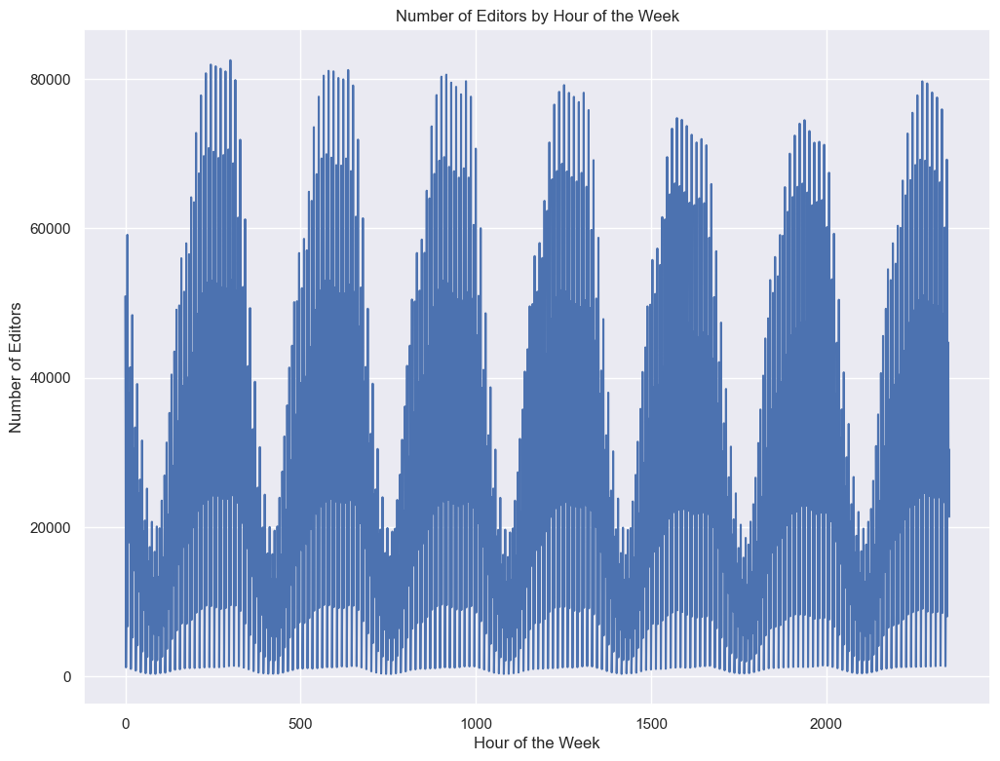

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# Asumir que data_pivot ya está definida
# Primero, necesitamos agregar el número de editores por hora de la semana a través de todas las categorías.

# Sumar el número de editores en todas las filas (idiomas) para cada columna (hora de la semana)
editors_per_hour = data_pivot.sum(axis=0)

# Crear el gráfico
plt.figure(figsize=(12, 9))
plt.plot(range(len(editors_per_hour)), editors_per_hour)
plt.xlabel('Hour of the Week')
plt.ylabel('Number of Editors')
plt.title('Number of Editors by Hour of the Week')
plt.show()

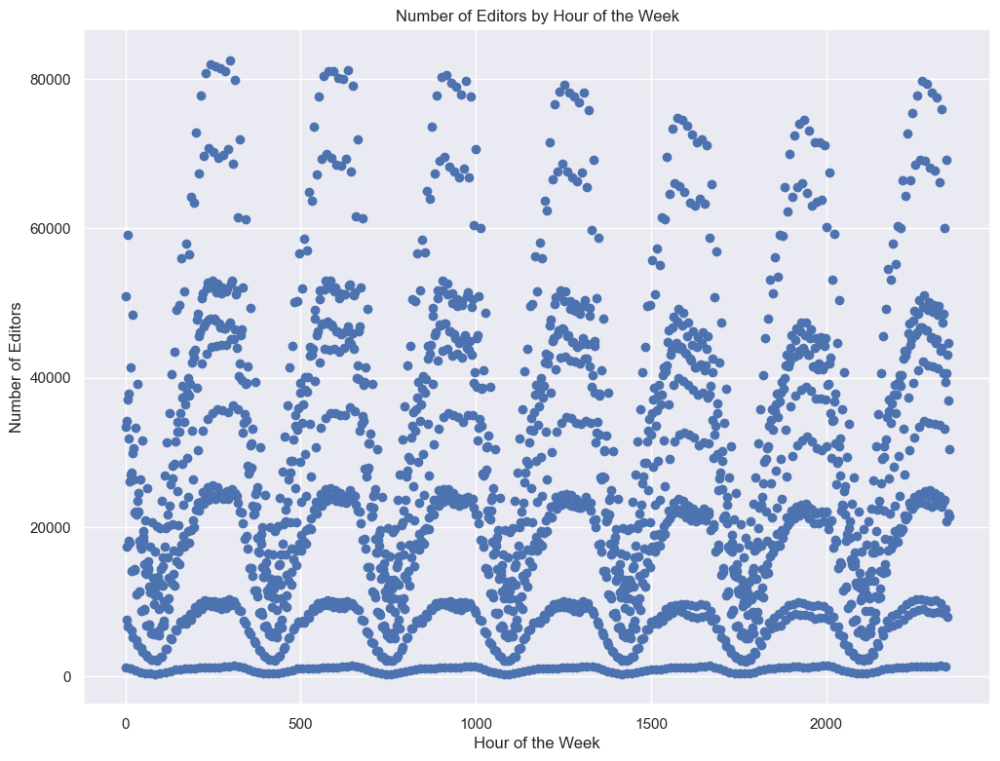

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# Crear el gráfico
plt.figure(figsize=(12, 9))
plt.scatter(range(len(editors_per_hour)), editors_per_hour)
plt.xlabel('Hour of the Week')
plt.ylabel('Number of Editors')
plt.title('Number of Editors by Hour of the Week')
plt.show()

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# For standardizing features. We'll use the StandardScaler module.
from sklearn.preprocessing import StandardScaler
# Sk Learn is one of the most widely used libraries for machine learning. We'll use the k means and pca modules.
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [32]:
data_pivot = pd.DataFrame(editors_per_hour)

In [25]:
data_pivot=df = data_pivot.drop(columns=['Segment K-means', 'Segment'])

In [26]:
scaler = StandardScaler()
segmentation_std = scaler.fit_transform(data_pivot)

In [7]:
segmentation_std = data_pivot

In [27]:
# Standardization
#scaler = StandardScaler()
#segmentation_std = scaler.fit_transform(data_pivot)

# PCA
pca = PCA()
pca.fit(segmentation_std)

# The attribute shows how much variance is explained by each of the seven individual components.
print(pca.explained_variance_ratio_)



[7.98626613e-01 8.00655164e-02 4.60493432e-02 3.73995797e-02
 2.07002095e-02 1.16106116e-02 3.67918440e-03 1.15670455e-03
 4.97802104e-04 2.14435405e-04 5.29505788e-32]


[7.98626613e-01 8.00655164e-02 4.60493432e-02 3.73995797e-02
 2.07002095e-02 1.16106116e-02 3.67918440e-03 1.15670455e-03
 4.97802104e-04 2.14435405e-04 5.29505788e-32]


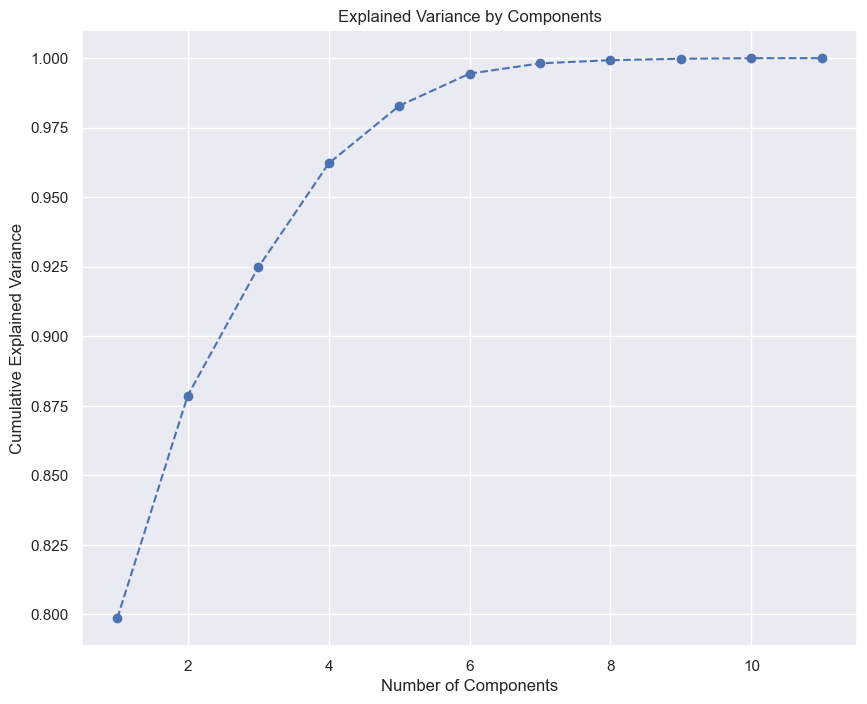

In [28]:
 #The attribute shows how much variance is explained by each of the individual components.
explained_variance_ratio = pca.explained_variance_ratio_
print(explained_variance_ratio)

# Graficar la varianza explicada acumulada
plt.figure(figsize=(10, 8))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio.cumsum(), marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [29]:
# Elegimos tres componentes. 3 o 4 parece la elección correcta según el gráfico anterior.
pca = PCA(n_components=3)

# Ajustamos el modelo con el número seleccionado de componentes. En nuestro caso, tres.
pca.fit(segmentation_std)



PCA(n_components=3)

In [30]:
scores_pca = pca.transform(segmentation_std)

In [12]:

# Varianza explicada por cada uno de los 3 componentes principales
explained_variance_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
cumulative_variance = np.cumsum(explained_variance_ratio)

# Imprimir resultados
print(f"Data NO Estandarizada EDITORES:")
print(f"Varianza explicada por cada componente: {explained_variance_ratio}")
print(f"Varianza acumulada: {cumulative_variance}")
print(f"Porcentaje de información retenida: {cumulative_variance[-1] * 100:.2f}%")
print(f"Porcentaje de información perdida: {(1 - cumulative_variance[-1]) * 100:.2f}%")

Data NO Estandarizada EDITORES:
Varianza explicada por cada componente: [0.88023635 0.06254261 0.02989221]
Varianza acumulada: [0.88023635 0.94277896 0.97267117]
Porcentaje de información retenida: 97.27%
Porcentaje de información perdida: 2.73%


In [31]:

# Varianza explicada por cada uno de los 3 componentes principales
explained_variance_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
cumulative_variance = np.cumsum(explained_variance_ratio)

# Imprimir resultados
print(f"Data SI Estandarizada EDITORES:")
print(f"Varianza explicada por cada componente: {explained_variance_ratio}")
print(f"Varianza acumulada: {cumulative_variance}")
print(f"Porcentaje de información retenida: {cumulative_variance[-1] * 100:.2f}%")
print(f"Porcentaje de información perdida: {(1 - cumulative_variance[-1]) * 100:.2f}%")

Data SI Estandarizada EDITORES:
Varianza explicada por cada componente: [0.79862661 0.08006552 0.04604934]
Varianza acumulada: [0.79862661 0.87869213 0.92474147]
Porcentaje de información retenida: 92.47%
Porcentaje de información perdida: 7.53%


In [13]:
# K-means clustering con PCA
# Ajustamos K means usando los datos transformados del PCA.
wcss = []
for i in range(1, 12):
    kmeans_pca = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` wi

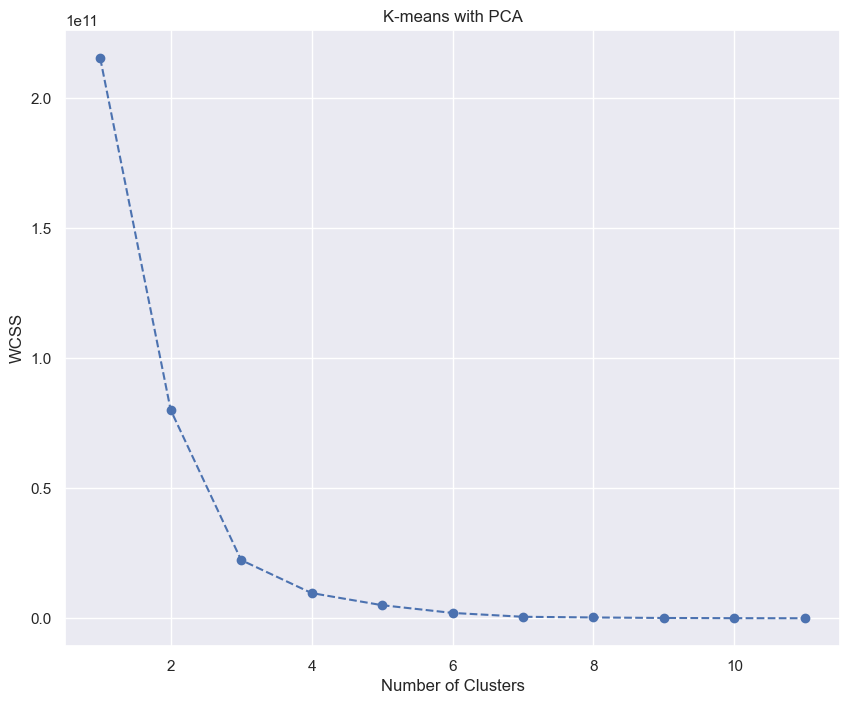

In [14]:
# Graficar el codo para determinar el número óptimo de clusters
plt.figure(figsize=(10, 8))
plt.plot(range(1, 12), wcss, marker='o', linestyle='--')
plt.title('K-means with PCA')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [15]:
# Hemos elegido cuatro clusters, por lo que ejecutamos K-means con el número de clusters igual a cuatro.
# Mismo inicializador y estado aleatorio que antes.
kmeans_pca = KMeans(n_clusters=4, init='k-means++', random_state=42)

# Ajustamos nuestros datos con el modelo k-means pca
kmeans_pca.fit(scores_pca)

/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=4, random_state=42)

In [16]:
# Creamos un nuevo DataFrame con las características originales y agregamos los puntajes PCA y los clusters asignados.
df_segm_pca_kmeans = pd.concat([data_pivot.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_segm_pca_kmeans.columns.values[-3:] = ['Component 1', 'Component 2', 'Component 3']

# La última columna que agregamos contiene las etiquetas de clustering de k-means con PCA.
df_segm_pca_kmeans['Segment K-means PCA'] = kmeans_pca.labels_

df_segm_pca_kmeans

,"(0, 1)","(0, 2)","(0, 4)","(0, 5)","(0, 6)","(0, 7)","(0, 8)","(0, 9)","(0, 10)","(0, 11)",...,"(167, 9)","(167, 10)","(167, 11)","(167, 12)","(167, 13)","(167, 14)",Component 1,Component 2,Component 3,Segment K-means PCA
0,810,591,231,800,559,859,296,884,619,858,...,880,624,846,589,357,330,-111648.129113,-22626.033950,-7787.820471,0
1,10550,2753,614,4637,823,7238,650,3397,1021,6408,...,4367,1307,7935,4351,3846,3710,58332.343654,96640.109547,4505.587449,2
2,14509,12582,1486,8839,4909,21719,1768,10052,15874,10688,...,11194,17828,12215,5147,15442,6072,347453.560990,-34970.377859,-32498.891701,3
3,4900,4565,769,5074,3243,6868,1016,2666,2720,5314,...,3277,3445,6679,2712,3613,2499,41758.230491,29856.729228,-16843.143384,2
4,429,145,38,431,79,613,48,334,136,347,...,493,216,501,236,285,192,-107331.621309,-11625.569766,-12047.305270,0
5,2482,2488,789,2040,1266,1879,328,1340,1116,1473,...,1717,1369,1817,1659,1589,1367,-63023.068200,-2601.289408,-9816.156567,0
6,6044,1201,1808,5588,2989,7540,986,6263,2934,4593,...,6968,3253,5130,2021,2019,2648,-787.619260,14725.077433,13498.759684,2
7,10111,10106,1288,4863,2947,12435,633,10186,8157,7002,...,10636,8490,7445,3568,1626,4215,115690.024649,-27090.328712,68225.612801,1
8,2324,1491,673,1803,647,2585,413,2964,940,1557,...,3272,1015,1679,1206,1125,924,-74533.527414,-10044.298935,2468.431087,0
9,214,237,113,311,186,296,113,344,255,344,...,396,311,381,124,94,71,-124846.797860,-25358.876638,-10644.240225,0


In [17]:
# Lista de idiomas (basada en la imagen proporcionada)
languages = ['ar', 'de', 'es', 'fr', 'hu', 'it', 'ja', 'pt', 'ru', 'vi', 'zh']

# Crear un DataFrame de idiomas
languages_df = pd.DataFrame(languages, columns=['language'])

# Asegurar que el índice de languages_df coincida con df_segm_pca_kmeans
languages_df.index = df_segm_pca_kmeans.index

In [18]:
# Combinar los DataFrames
df_combined = pd.concat([languages_df, df_segm_pca_kmeans['Segment K-means PCA']], axis=1)

# Mostrar el nuevo DataFrame
df_combined

,language,Segment K-means PCA
0,ar,0
1,de,2
2,es,3
3,fr,2
4,hu,0
5,it,0
6,ja,2
7,pt,1
8,ru,0
9,vi,0


In [19]:
df_segm_pca_kmeans['Segment'] = df_segm_pca_kmeans['Segment K-means PCA'].map({
    0: 'first',
    1: 'second',
    2: 'third',
    3: 'fourth'
})

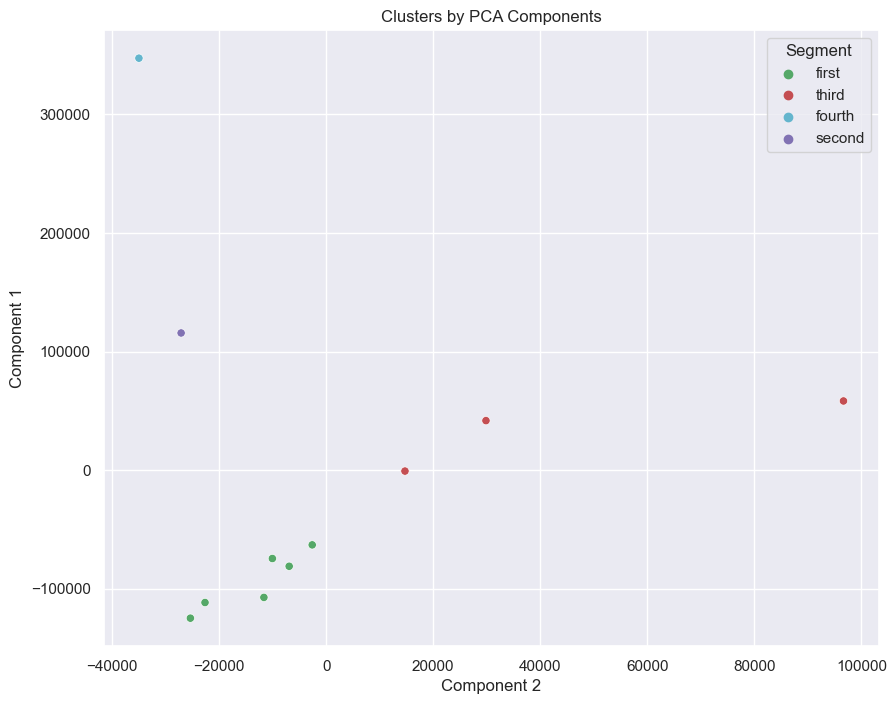

In [20]:
# Graficar datos por componentes PCA. El eje Y es el primer componente, el eje X es el segundo.
x_axis = df_segm_pca_kmeans['Component 2']
y_axis = df_segm_pca_kmeans['Component 1']
plt.figure(figsize=(10, 8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_kmeans['Segment'], palette=['g', 'r', 'c', 'm'])
plt.title('Clusters by PCA Components')
plt.show()

/Users/andrevill/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


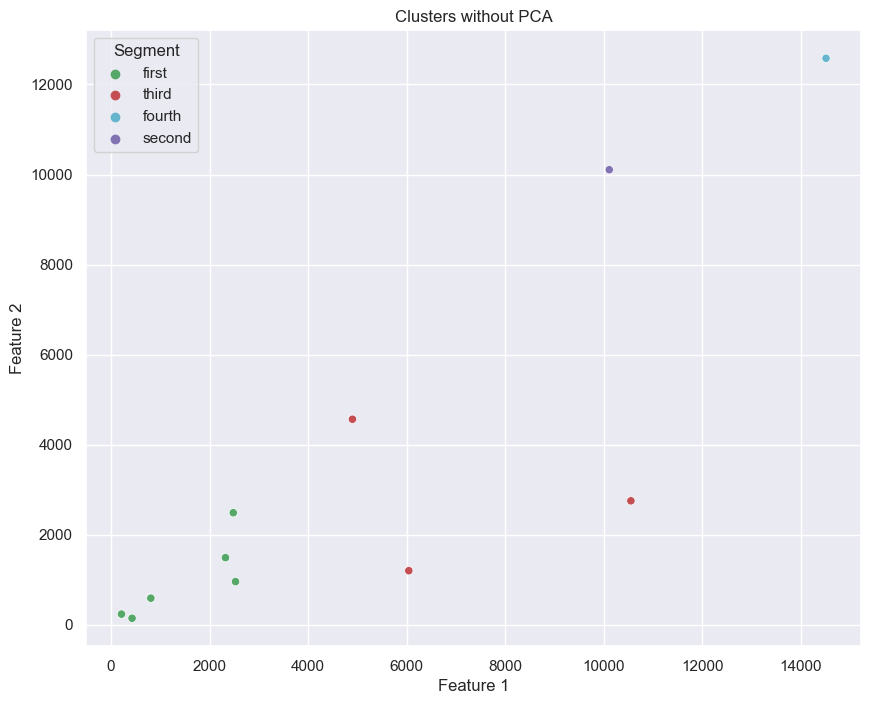

In [21]:
# K-means clustering sin PCA
kmeans_no_pca = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans_no_pca.fit(segmentation_std)

# Agregar las etiquetas de clustering al DataFrame original
data_pivot['Segment K-means'] = kmeans_no_pca.labels_

# Asignar etiquetas de texto a los clusters
data_pivot['Segment'] = data_pivot['Segment K-means'].map({
    0: 'first',
    1: 'second',
    2: 'third',
    3: 'fourth'
})

# Graficar los clusters sin PCA
plt.figure(figsize=(10, 8))
sns.scatterplot(x=data_pivot.iloc[:, 0], y=data_pivot.iloc[:, 1], hue=data_pivot['Segment'], palette=['g', 'r', 'c', 'm'])
plt.title('Clusters without PCA')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [64]:
cluster_sums = data_pivot.groupby('Segment').sum()

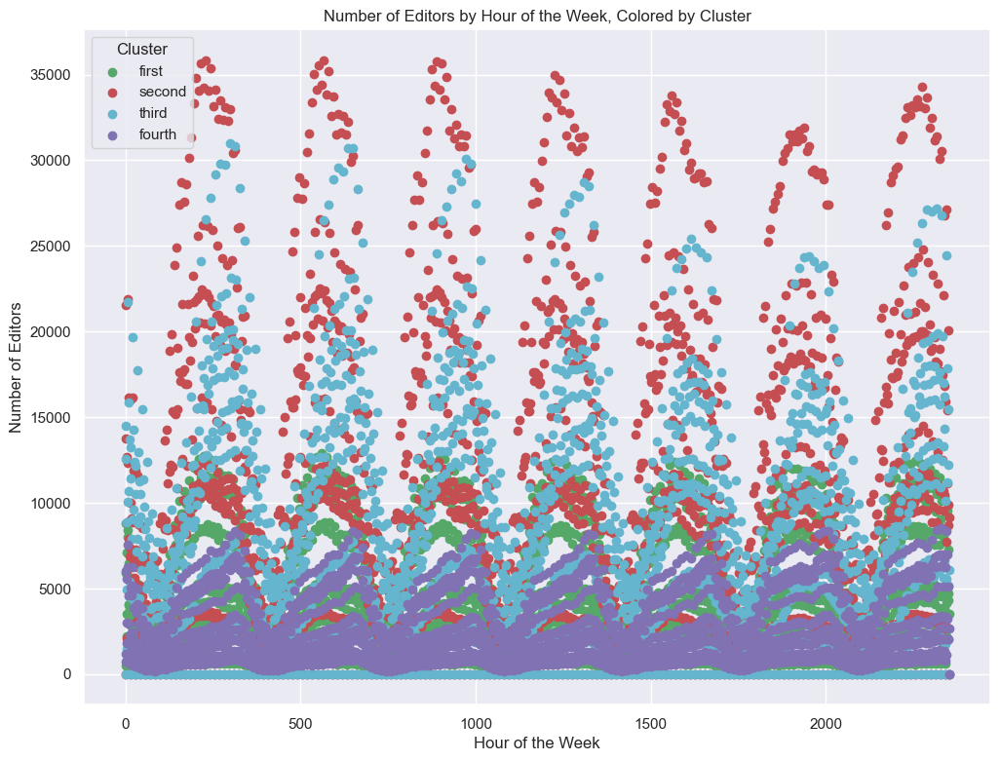

In [65]:
plt.figure(figsize=(12, 9))
colors = {'first': 'g', 'second': 'r', 'third': 'c', 'fourth': 'm'}

for segment, color in colors.items():
    plt.scatter(range(cluster_sums.shape[1]), cluster_sums.loc[segment], label=segment, color=color)

plt.xlabel('Hour of the Week')
plt.ylabel('Number of Editors')
plt.title('Number of Editors by Hour of the Week, Colored by Cluster')
plt.legend(title='Cluster')
plt.show()

In [22]:
import pandas as pd

# Lista de idiomas (basada en la imagen proporcionada)
languages = ['ar', 'de', 'es', 'fr', 'hu', 'it', 'ja', 'pt', 'ru', 'vi', 'zh']

# Crear un DataFrame de idiomas
languages_df = pd.DataFrame(languages, columns=['language'])

# Asegurar que el índice de languages_df coincida con df_segm_pca_kmeans
languages_df.index = df_segm_pca_kmeans.index

# Combinar los DataFrames
df_combined = pd.concat([languages_df, df_segm_pca_kmeans[['Component 1', 'Component 2', 'Component 3']]], axis=1)

# Establecer los idiomas como índice
df_combined.set_index('language', inplace=True)

# Mostrar el nuevo DataFrame
print(df_combined)

            Component 1   Component 2   Component 3
language                                           
ar       -111648.129113 -22626.033950  -7787.820471
de         58332.343654  96640.109547   4505.587449
es        347453.560990 -34970.377859 -32498.891701
fr         41758.230491  29856.729228 -16843.143384
hu       -107331.621309 -11625.569766 -12047.305270
it        -63023.068200  -2601.289408  -9816.156567
ja          -787.619260  14725.077433  13498.759684
pt        115690.024649 -27090.328712  68225.612801
ru        -74533.527414 -10044.298935   2468.431087
vi       -124846.797860 -25358.876638 -10644.240225
zh        -81063.396627  -6905.140940    939.166597


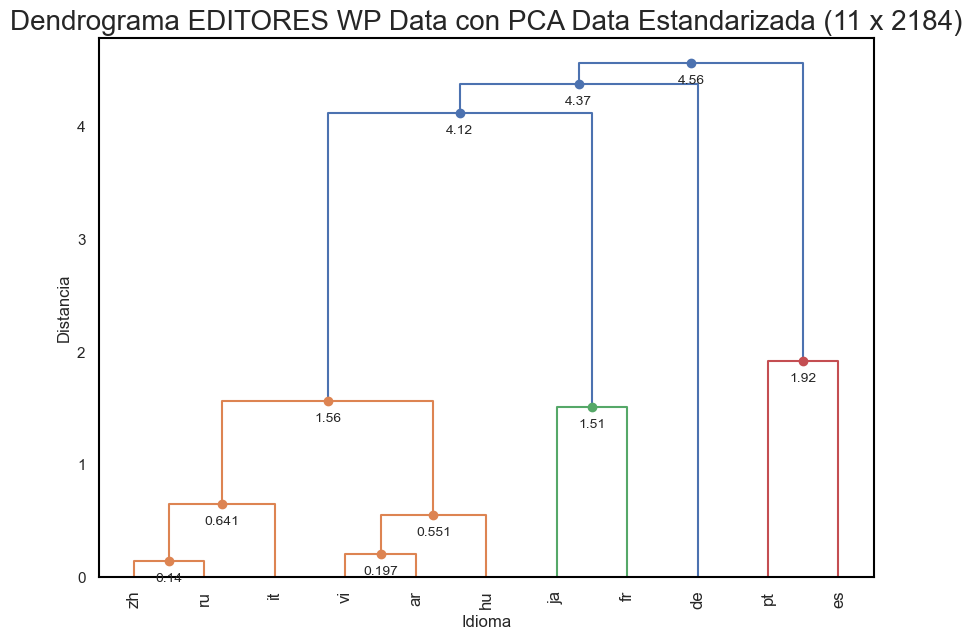

In [67]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_combined)

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma EDITORES WP Data con PCA Data Estandarizada (11 x 2184)',fontsize=20)
plt.grid(False)
plt.gca().set_facecolor('white')
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
ax = plt.gca()
ax.set_facecolor('white')
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.5)

# Mostrar el gráfico
plt.savefig('editores/dendrogram4.png')
plt.show()


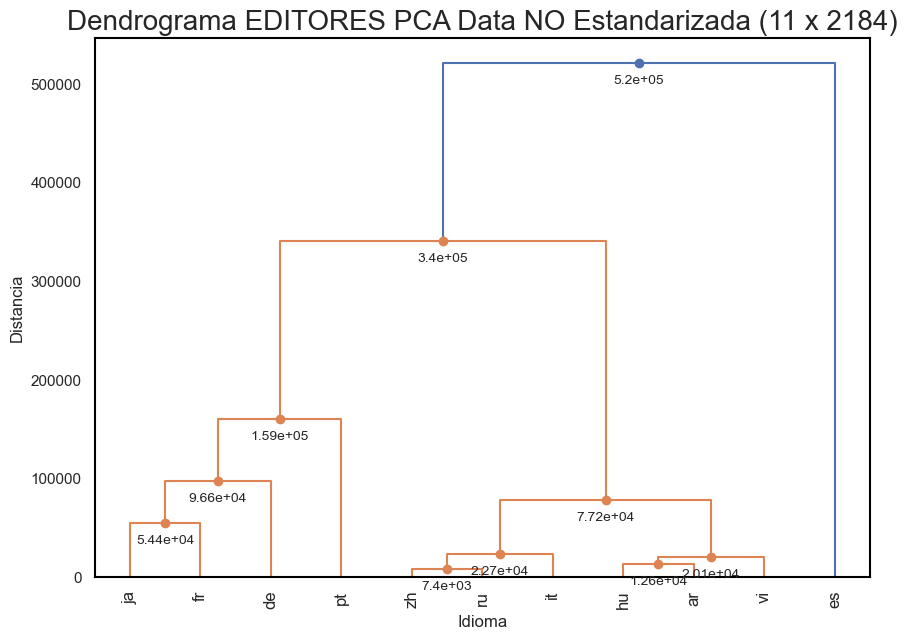

In [23]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


# Normalizar los datos utilizando z-score
scaler = StandardScaler()
data_scaled = df_combined

# Realizar la clusterización jerárquica
linked = linkage(data_scaled, method='ward')

# Crear etiquetas para cada fila basadas en el idioma
labels = data_pivot.index.tolist()

# Generar el dendrograma y capturar la salida para acceder a las coordenadas de los enlaces
plt.figure(figsize=(10, 7))
dendro = dendrogram(linked,
                    labels=labels,
                    distance_sort='descending',
                    show_leaf_counts=True)

# Añadir anotaciones de distancia
for i, d, c in zip(dendro['icoord'], dendro['dcoord'], dendro['color_list']):
    x = 0.5 * sum(i[1:3])
    y = d[1]
    if y > 0:  # Solo añadir etiquetas por encima de la línea cero para claridad
        plt.plot(x, y, 'o', c=c)
        plt.annotate(f"{y:.3g}", (x, y), xytext=(0, -8),
                     textcoords='offset points', va='top', ha='center', fontsize='small')
plt.title('Dendrograma EDITORES PCA Data NO Estandarizada (11 x 2184)',fontsize=20)
plt.grid(False)
plt.gca().set_facecolor('white')
plt.xlabel('Idioma')
plt.ylabel('Distancia')
plt.xticks(rotation=90)
ax = plt.gca()
ax.set_facecolor('white')
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.5)

# Mostrar el gráfico
plt.savefig('editores/dendrogram3.png')
plt.show()


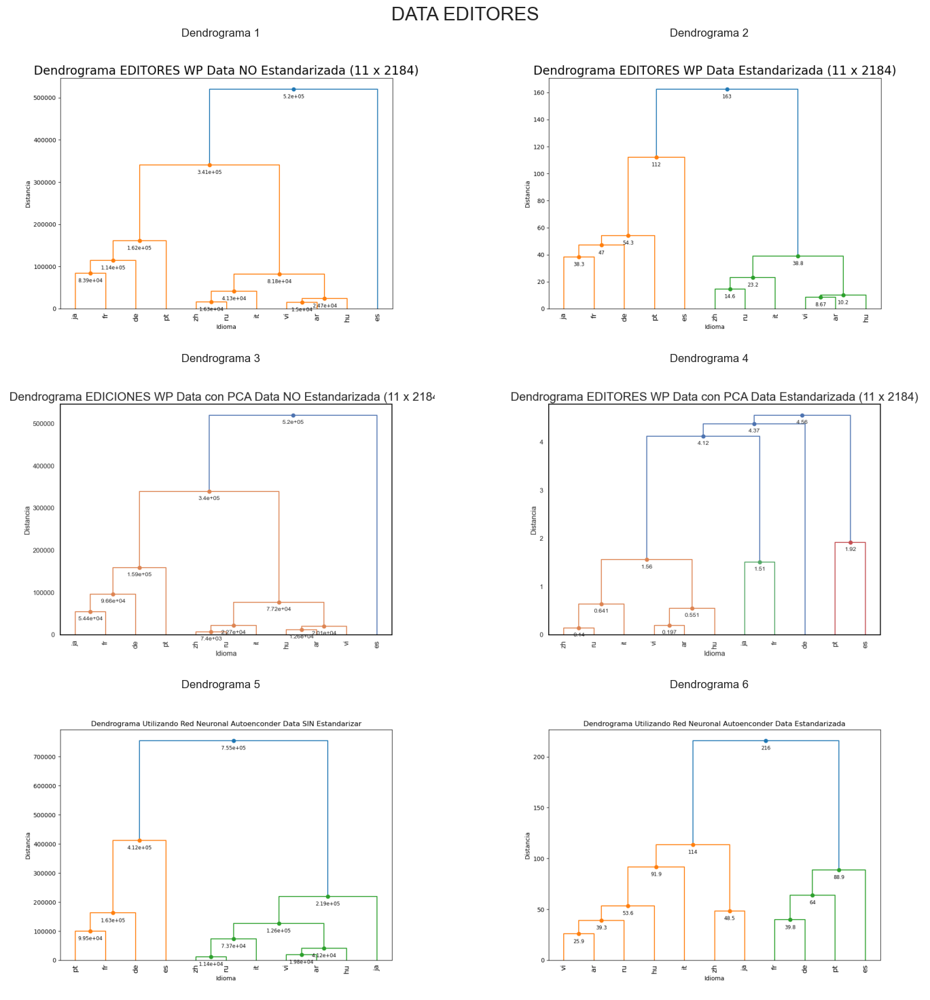

In [68]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Cargar las imágenes de los dendrogramas
img1 = mpimg.imread('editores/dendrogram1.png')
img2 = mpimg.imread('editores/dendrogram2.png')
img3 = mpimg.imread('editores/dendrogram3.png')
img4 = mpimg.imread('editores/dendrogram4.png')
img5 = mpimg.imread('editores/dendrogram7.png')
img6 = mpimg.imread('editores/dendrogram8.png')

# Crear un solo plot con 6 cuadrantes (3x2)
fig, axs = plt.subplots(3, 2, figsize=(15, 15))
fig.suptitle('DATA EDITORES', fontsize=20)

# Mostrar las imágenes en cada subplot
axs[0, 0].imshow(img1)
axs[0, 0].axis('off')
axs[0, 0].set_title('Dendrograma 1')

axs[0, 1].imshow(img2)
axs[0, 1].axis('off')
axs[0, 1].set_title('Dendrograma 2')

axs[1, 0].imshow(img3)
axs[1, 0].axis('off')
axs[1, 0].set_title('Dendrograma 3')

axs[1, 1].imshow(img4)
axs[1, 1].axis('off')
axs[1, 1].set_title('Dendrograma 4')

axs[2, 0].imshow(img6)
axs[2, 0].axis('off')
axs[2, 0].set_title('Dendrograma 5')

axs[2, 1].imshow(img5)
axs[2, 1].axis('off')
axs[2, 1].set_title('Dendrograma 6')

plt.tight_layout()
plt.show()